## Exploratory Data Analysis


In [1]:
import os
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd

In [32]:
col_names = ["image_name", "x1", "y1", "x2", "y2", "class", "image_width", "image_height"]

#Paths

images_path = '../data/images/'
annotations_path = '../data/annotations/'

#CSV to DataFrames

img_train = pd.read_csv(annotations_path+'annotations_train.csv', names=col_names)
img_val = pd.read_csv(annotations_path+'annotations_val.csv', names=col_names)
img_test = pd.read_csv(annotations_path+'annotations_test.csv', names=col_names)


#Boxes Area and Img Area

img_train['box_area'] = (img_train.x2-img_train.x1)*(img_train.y2-img_train.y1)
img_train['img_area'] = img_train.image_width*img_train.image_height

img_val['box_area'] = (img_val.x2-img_val.x1)*(img_val.y2-img_val.y1)
img_val['img_area'] = img_val.image_width*img_val.image_height

img_test['box_area'] = (img_test.x2-img_test.x1)*(img_test.y2-img_test.y1)
img_test['img_area'] = img_test.image_width*img_test.image_height

### Data Frames Overview

In [33]:
print(img_train.head(10))

    image_name    x1    y1    x2    y2   class  image_width  image_height  \
0  train_0.jpg   208   537   422   814  object         3024          3024   
1  train_0.jpg  1268  1923  1365  2209  object         3024          3024   
2  train_0.jpg  1135  2074  1261  2166  object         3024          3024   
3  train_0.jpg  1045  2085  1122  2258  object         3024          3024   
4  train_0.jpg   976  2036  1040  2177  object         3024          3024   
5  train_0.jpg   863  2048   937  2194  object         3024          3024   
6  train_0.jpg   772  2097   843  2244  object         3024          3024   
7  train_0.jpg   659  2157   724  2222  object         3024          3024   
8  train_0.jpg   568  2066   645  2198  object         3024          3024   
9  train_0.jpg   488  2097   558  2257  object         3024          3024   

   box_area  img_area  
0     59278   9144576  
1     27742   9144576  
2     11592   9144576  
3     13321   9144576  
4      9024   9144576  
5     10

### Amount of Images

In [34]:
print(img_train.image_name.nunique(), "--> images for Training")
print(img_val.image_name.nunique(), "---> images for Validation")
print(img_test.image_name.nunique(), "--> images for Testing")
print(img_train.image_name.nunique() + img_val.image_name.nunique() + img_test.image_name.nunique(), "-> total images")

8219 --> images for Training
588 ---> images for Validation
2936 --> images for Testing
11743 -> total images


### Classes

In [6]:
print(img_train['class'].nunique(), "---> is the number of different classes for Training")
print(img_val['class'].nunique(), "---> is the number of different classes for Validation")
print(img_test['class'].nunique(), "---> is the number of different classes for Testing")

1 ---> is the number of different classes for Training
1 ---> is the number of different classes for Validation
1 ---> is the number of different classes for Testing


**As we only have 1 Class, let's see the name:**

In [8]:
print(img_train['class'].unique())

['object']


### Bounding Boxes

In [12]:
print(int(img_train.image_name.value_counts().mean()), "-> is the average amount of bouding boxes in Training Data")
print(int(img_train.image_name.value_counts().max()), "-> is the maximum number of bounding boxes in an image in Training Data")
print(int(img_train.image_name.value_counts().min()), "---> is the minimum number of bounding boxes in an image in Training Data")
print("\n")
print(int(img_val.image_name.value_counts().mean()), "-> is the average amount of bouding boxes in Validation Data")
print(int(img_val.image_name.value_counts().max()), "-> is the maximum number of bounding boxes in an image in Validation Data")
print(int(img_val.image_name.value_counts().min()), "--> is the minimum number of bounding boxes in an image in Validation Data")
print("\n")
print(int(img_test.image_name.value_counts().mean()), "-> is the average amount of bouding boxes in Test Data")
print(int(img_test.image_name.value_counts().max()), "-> is the maximum number of bounding boxes in an image in Test Data")
print(int(img_test.image_name.value_counts().min()), "--> is the minimum number of bounding boxes in an image in Test Data")

147 -> is the average amount of bouding boxes in Training Data
576 -> is the maximum number of bounding boxes in an image in Training Data
1 ---> is the minimum number of bounding boxes in an image in Training Data


154 -> is the average amount of bouding boxes in Validation Data
718 -> is the maximum number of bounding boxes in an image in Validation Data
40 --> is the minimum number of bounding boxes in an image in Validation Data


146 -> is the average amount of bouding boxes in Test Data
533 -> is the maximum number of bounding boxes in an image in Test Data
20 --> is the minimum number of bounding boxes in an image in Test Data


### Images' Size

In [29]:
print("* Values of images' width in Training Data: ", list(img_train.image_width.unique()))
print("* Values of images' height in Training Data: ", list(img_train.image_height.unique()))
print("\n")
print("* Values of images' width in Validation Data: ", list(img_val.image_width.unique()))
print("* Values of images' height in Validation Data: ", list(img_val.image_height.unique()))
print("\n")
print("* Values of images' width in Testing Data: ", list(img_test.image_width.unique()))
print("* Values of images' height in Testing Data: ", list(img_test.image_height.unique()))

* Values of images' width in Training Data:  [3024, 1920, 2448, 2340, 2336, 2592, 3120, 2560, 3264, 4160, 2322, 4128, 3104, 3840, 2368, 2268, 2988, 3096, 2400, 2304, 2160, 1932, 480, 1944, 4096, 4320, 4208, 2432, 3000, 1152, 1936, 720, 1836]
* Values of images' height in Training Data:  [3024, 2560, 3264, 4160, 4608, 4208, 1920, 2448, 2340, 4128, 3096, 4032, 2336, 4192, 2160, 4224, 5312, 3200, 4096, 3840, 2576, 640, 2592, 2322, 2304, 3120, 2432, 4320, 4000, 1936, 1836, 3984, 1280]


* Values of images' width in Validation Data:  [2336, 2448, 2340, 3264, 3024, 1920, 2160, 2592, 3120, 4208, 2560, 3840, 4128, 2988, 1840, 2304, 4320, 2322, 3096, 4160, 1936, 3104, 2268, 2400, 2449]
* Values of images' height in Validation Data:  [4160, 3264, 2448, 3024, 2560, 3840, 4608, 4208, 3120, 1920, 2160, 3096, 5312, 4096, 2432, 4032, 4128, 2340, 2592, 4192, 3200, 3265]


* Values of images' width in Testing Data:  [2448, 1920, 2340, 3840, 2368, 3264, 3096, 2336, 3120, 2560, 2160, 2322, 2988, 3104, 22

### Bounding Boxes Area relative to Images Area (area factor)

In [41]:
train_area_ratio_list=[]
for img in img_train.image_name.unique(): #each unique img
    mask = img_train['image_name'] == img
    area_boxes_total = img_train[mask].box_area.sum()
    area_img = img_train[mask].img_area.iloc[0]
    train_area_ratio_list.append(area_boxes_total/area_img)  

In [44]:
val_area_ratio_list=[]
for img in img_val.image_name.unique(): #each unique img
    mask = img_val['image_name'] == img
    area_boxes_total = img_val[mask].box_area.sum()
    area_img = img_val[mask].img_area.iloc[0]
    val_area_ratio_list.append(area_boxes_total/area_img)

In [46]:
test_area_ratio_list=[]
for img in img_test.image_name.unique(): #each unique img
    mask = img_test['image_name'] == img
    area_boxes_total = img_test[mask].box_area.sum()
    area_img = img_test[mask].img_area.iloc[0]
    test_area_ratio_list.append(area_boxes_total/area_img)

In [47]:
print(max(train_area_ratio_list), "is the maximum area factor in Training Data")
print(min(train_area_ratio_list), "is the minimum area factor in Training Data")
print(sum(train_area_ratio_list)/len(train_area_ratio_list), "is the average area factor in Training Data")
print("\n")
print(max(val_area_ratio_list), "is the maximum area factor in Validation Data")
print(min(val_area_ratio_list), "is the minimum area factor in Validation Data")
print(sum(val_area_ratio_list)/len(val_area_ratio_list), "is the average area factor in Validation Data")
print("\n")
print(max(test_area_ratio_list), "is the maximum area factor in Test Data")
print(min(test_area_ratio_list), "is the minimum area factor in Test Data")
print(sum(test_area_ratio_list)/len(test_area_ratio_list), "is the average area factor in Test Data")

0.7571863795244677 is the maximum area factor in Training Data
0.006115401080084299 is the minimum area factor in Training Data
0.42139916319147097 is the average area factor in Training Data


0.714908447265625 is the maximum area factor in Validation Data
0.1075072287902089 is the minimum area factor in Validation Data
0.414542158422264 is the average area factor in Validation Data


0.7320472945101243 is the maximum area factor in Test Data
0.05714335123697917 is the minimum area factor in Test Data
0.4204749354595521 is the average area factor in Test Data


## Show 10 random images with their bounding boxes

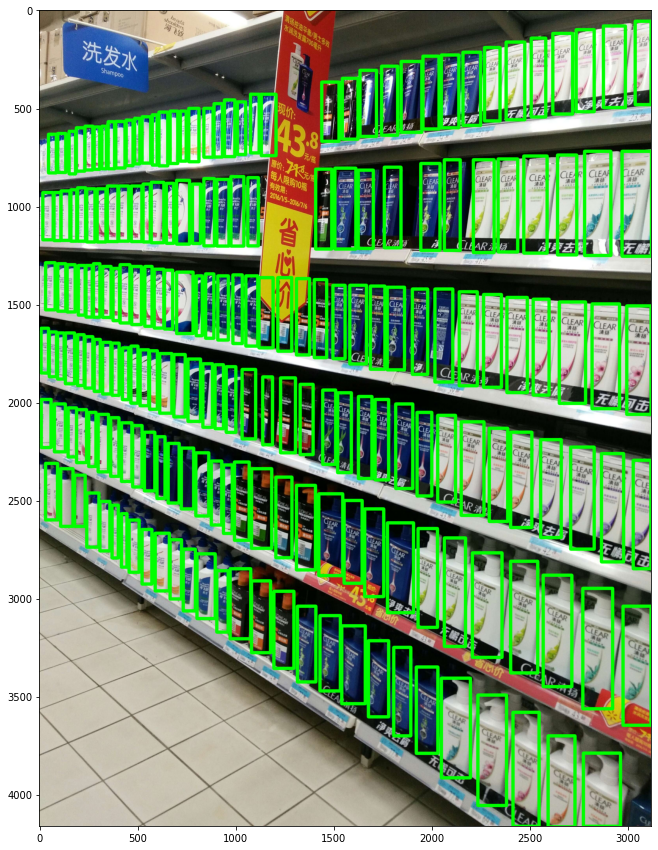

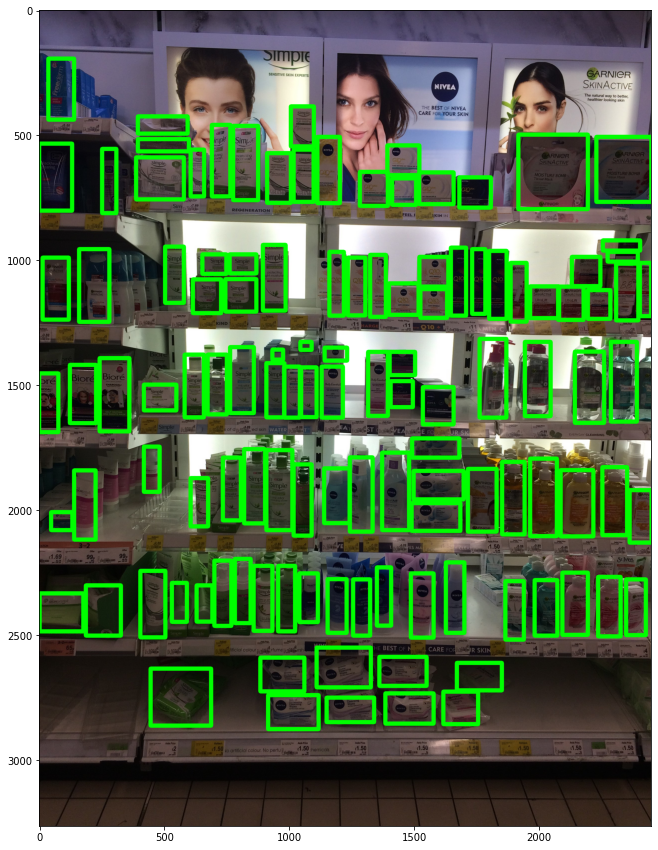

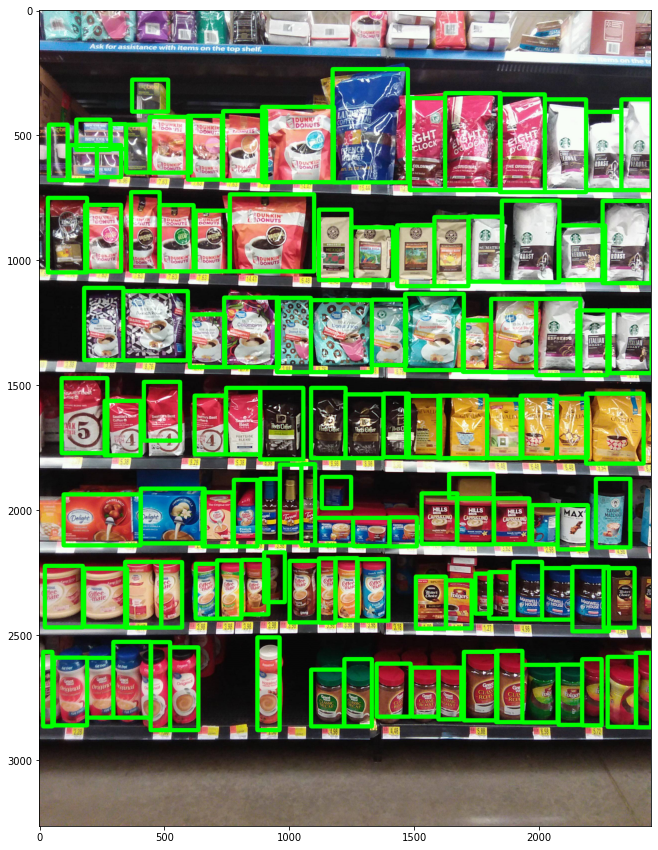

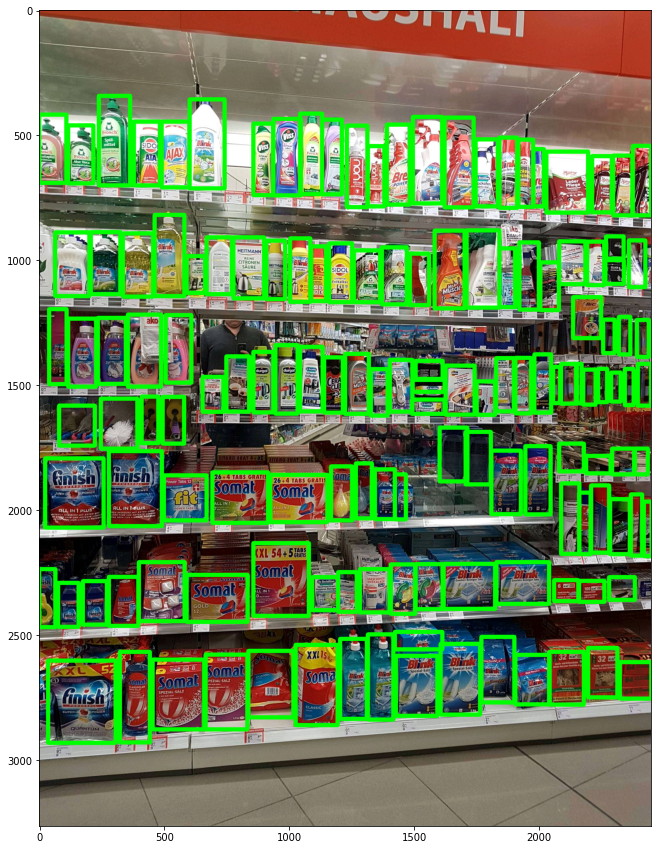

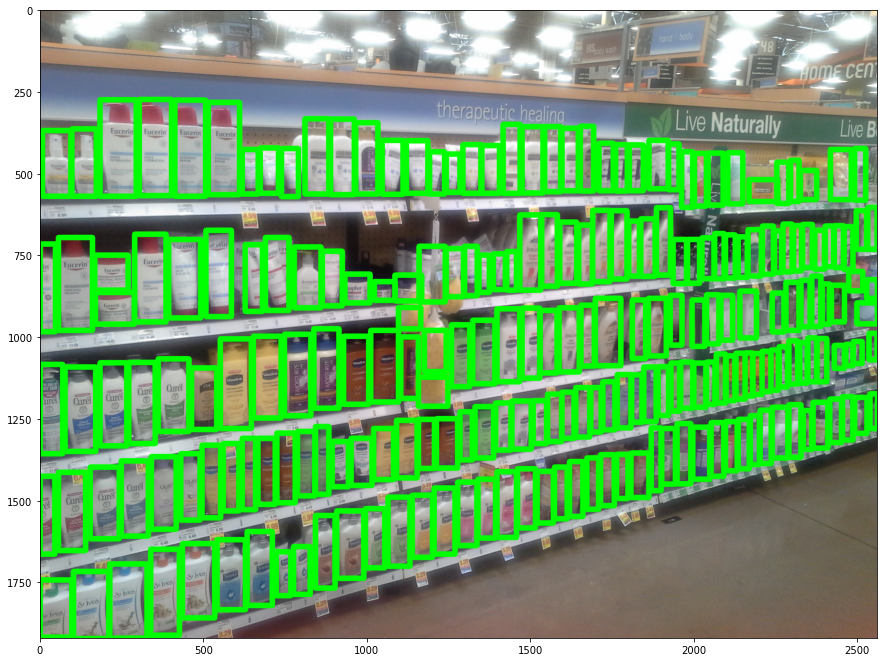

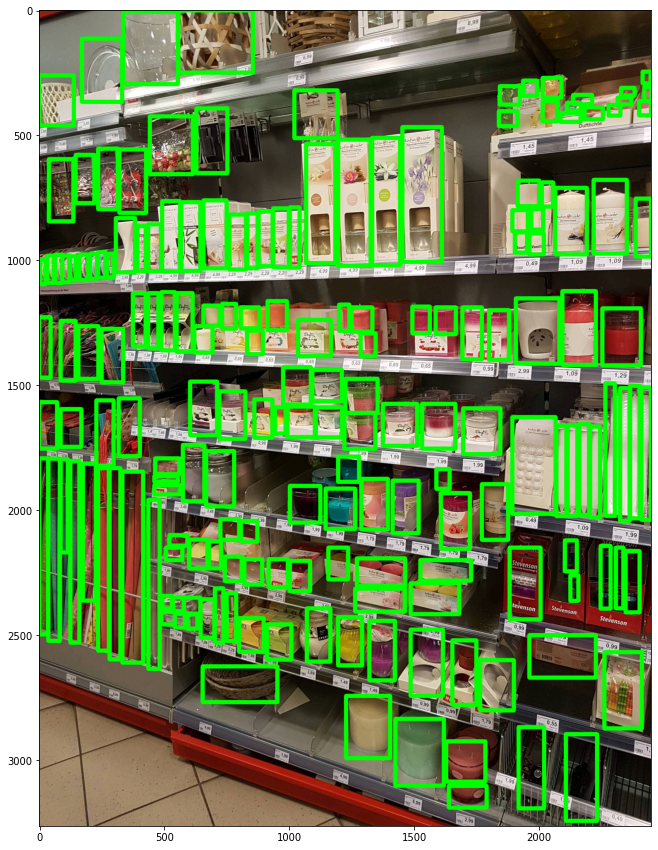

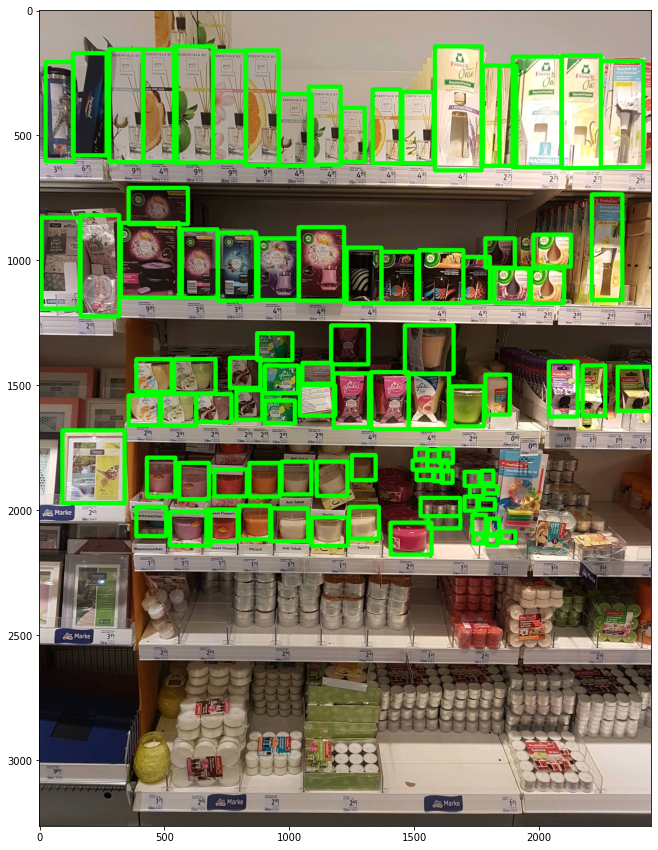

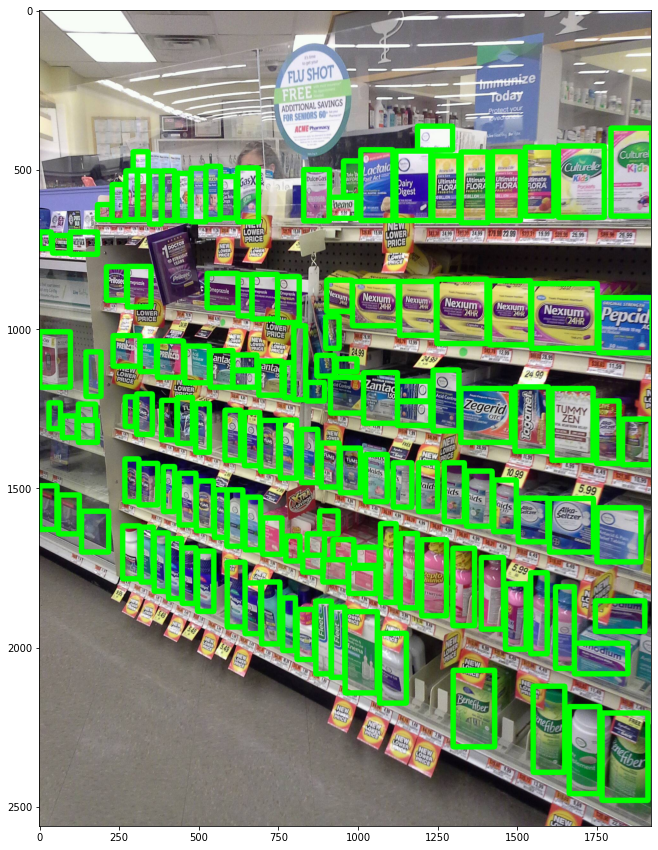

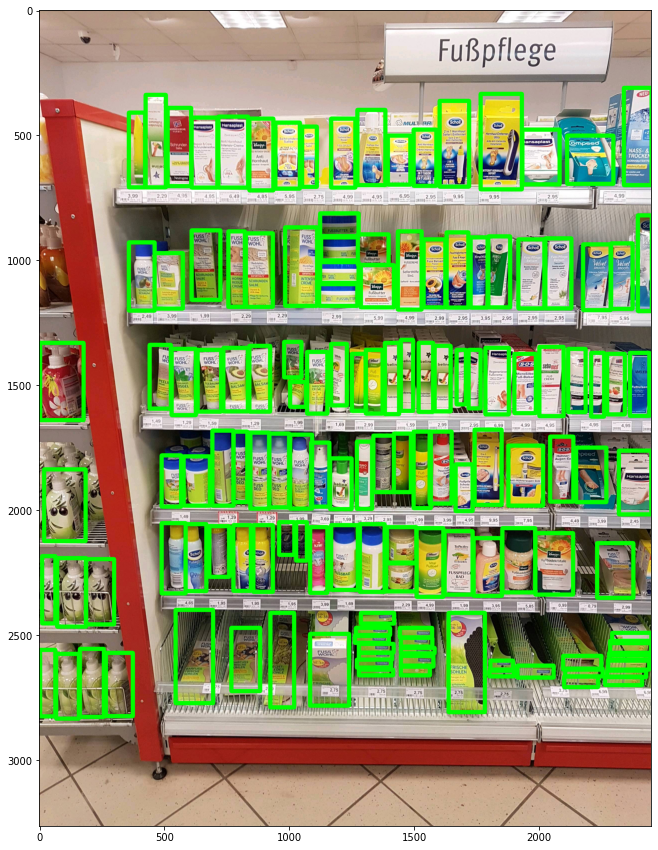

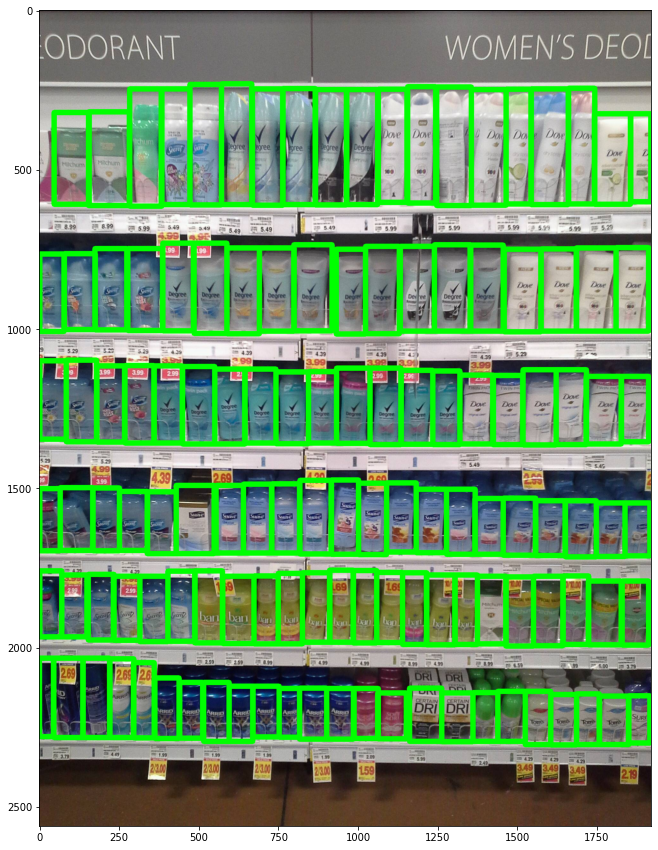

In [40]:
#Selecting Images
images = os.listdir(images_path)
n_img=10
img_list = random.sample(images, n_img)

#Concatenating all DF
labels_list = [img_train, img_val, img_test]
labels = pd.concat(labels_list)

# Bounding boxes color
color = (0, 255, 0)
   
# Line thickness
thickness = 15

for img_elem in img_list:
    # Get bounding boxes
    gt_bb = labels.loc[labels['image_name'] == img_elem]
    # Load a random image
    img = cv2.imread(os.path.join(images_path, img_elem))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for _, bb in gt_bb.iterrows():
        # Start coordinate, represents the top left corner of rectangle
        start_point = (bb['x1'], bb['y1'])

        # Ending coordinate,represents the bottom right corner of rectangle
        end_point = (bb['x2'], bb['y2'])

        # Using cv2.rectangle() method, Draw a rectangle of black color of thickness -1 px
        img_rgb = cv2.rectangle(img_rgb, start_point, end_point, color, thickness)

    # Display
    fig = plt.figure(figsize = (15,15))
    plt.imshow(img_rgb)
    plt.show()